In [1]:
# Import libraries

import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd
import plotly.graph_objs as go
import seaborn as sns
import tqdm  
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score,
    auc,
    confusion_matrix,
    f1_score,
    precision_score,
    recall_score,
    roc_curve,
)
from sklearn.model_selection import GridSearchCV, learning_curve, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier, plot_tree
from IPython.display import clear_output

pd.set_option("display.width", None)
pd.set_option("display.max_columns", None)

In [2]:
project_path = "E:/Praca dyplomowa - Data Science"

In [3]:
# Loading the dataset

df = pd.read_csv(f"{project_path}/Zbiór danych/archive/mushrooms.csv")

In [4]:
# Data preprocessing

for col in df.columns:
    try:
        df[col] = df[col].str.strip()
    except AttributeError:
        pass

In [5]:
# Class distribution, number of instances, number of features

labels = df["class"].value_counts().index
values = df["class"].value_counts().values

fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
fig.update_traces(
    hoverinfo="label+percent",
    textinfo="value",
    textfont_size=20,
    marker=dict(colors=["#87CEFA", "#7FFF00"], line=dict(color="#FFFFFF", width=3)),
)
fig.update_layout(title="Class distribution in the dataset")
fig.show()

print(f"Number of instances: {df.shape[0]}")
print(f"Number of features: {df.shape[1]}")
print(len(df), len(df.dropna()))

Number of instances: 8124
Number of features: 23
8124 8124


In [6]:
# Checking the value counts for each column

for col in df.columns:
    counts = df[col].value_counts(dropna=False)
    print(counts)
    print()

class
e    4208
p    3916
Name: count, dtype: int64

cap-shape
x    3656
f    3152
k     828
b     452
s      32
c       4
Name: count, dtype: int64

cap-surface
y    3244
s    2556
f    2320
g       4
Name: count, dtype: int64

cap-color
n    2284
g    1840
e    1500
y    1072
w    1040
b     168
p     144
c      44
u      16
r      16
Name: count, dtype: int64

bruises
f    4748
t    3376
Name: count, dtype: int64

odor
n    3528
f    2160
y     576
s     576
a     400
l     400
p     256
c     192
m      36
Name: count, dtype: int64

gill-attachment
f    7914
a     210
Name: count, dtype: int64

gill-spacing
c    6812
w    1312
Name: count, dtype: int64

gill-size
b    5612
n    2512
Name: count, dtype: int64

gill-color
b    1728
p    1492
w    1202
n    1048
g     752
h     732
u     492
k     408
e      96
y      86
o      64
r      24
Name: count, dtype: int64

stalk-shape
t    4608
e    3516
Name: count, dtype: int64

stalk-root
b    3776
?    2480
e    1120
c     556
r     192

In [7]:
# Visualization of plots

plots_data = df.copy(
    deep=True
)  

mappings = {
    "class": {"e": "edible", "p": "poisonous"},
    "cap-shape": {"b": "bell", "c": "conical", "x": "convex", "f": "flat", "k": "knobbed", "s": "sunken"},
    "cap-surface": {"f": "fibrous", "g": "grooves", "y": "scaly", "s": "smooth"},
    "cap-color": {
        "n": "brown",
        "b": "buff",
        "c": "cinnamon",
        "g": "gray",
        "r": "green",
        "p": "pink",
        "u": "purple",
        "e": "red",
        "w": "white",
        "y": "yelllow",
    },
    "bruises": {"t": "bruises", "f": "no"},
    "odor": {
        "a": "almond",
        "l": "anise",
        "c": "creosote",
        "y": "fishy",
        "f": "foul",
        "m": "musty",
        "n": "none",
        "p": "pungent",
        "s": "spicy",
    },
    "gill-attachment": {"a": "attached", "d": "descending", "f": "free", "n": "notched"},
    "gill-spacing": {"c": "close", "w": "crowded", "d": "distant"},
    "gill-size": {"b": "broad", "n": "narrow"},
    "gill-color": {
        "k": "black",
        "n": "brown",
        "b": "buff",
        "h": "chocolate",
        "g": "gray",
        "r": "green",
        "o": "orange",
        "p": "pink",
        "u": "purple",
        "e": "red",
        "w": "white",
        "y": "yellow",
    },
    "stalk-shape": {"e": "enlarging", "t": "tapering"},
    "stalk-root": {
        "b": "bulbous",
        "c": "club",
        "u": "cup",
        "e": "equal",
        "z": "rhizomorphis",
        "r": "rooted",
        "?": "missing",
    },
    "stalk-surface-above-ring": {"f": "fibrous", "y": "scaly", "k": "silky", "s": "smooth"},
    "stalk-surface-below-ring": {"f": "fibrous", "y": "scaly", "k": "silky", "s": "smooth"},
    "stalk-color-above-ring": {
        "n": "brown",
        "b": "buff",
        "c": "cinnamon",
        "g": "gray",
        "o": "orange",
        "p": "pink",
        "e": "red",
        "w": "white",
        "y": "yellow",
    },
    "stalk-color-below-ring": {
        "n": "brown",
        "b": "buff",
        "c": "cinnamon",
        "g": "gray",
        "o": "orange",
        "p": "pink",
        "e": "red",
        "w": "white",
        "y": "yellow",
    },
    "veil-type": {"p": "partial", "u": "universal"},
    "veil-color": {"n": "brown", "o": "orange", "w": "white", "y": "yellow"},
    "ring-number": {"n": "none", "o": "one", "t": "two"},
    "ring-type": {
        "c": "cobwebby",
        "e": "evanescent",
        "f": "flaring",
        "l": "large",
        "n": "none",
        "p": "pendant",
        "s": "sheathing",
        "z": "zone",
    },
    "spore-print-color": {
        "k": "black",
        "n": "brown",
        "b": "buff",
        "h": "chocolate",
        "r": "green",
        "o": "orange",
        "u": "purple",
        "w": "white",
        "y": "yellow",
    },
    "population": {
        "a": "abundant",
        "c": "clustered",
        "n": "numerous",
        "s": "scattered",
        "v": "several",
        "y": "solitary",
    },
    "habitat": {"g": "grasses", "l": "leaves", "m": "meadows", "p": "paths", "u": "urban", "w": "waste", "d": "woods"},
}

for col in plots_data.columns:
    if mapping := mappings.get(
        col
    ):  
        plots_data[col] = plots_data[col].map(mapping)


nrows = 7
ncols = 3

skipped_cols = ["class", "veil-type"]  

cols_to_plot = np.array(
    [col for col in plots_data.columns if col not in skipped_cols]
)  
cols_to_plot = cols_to_plot.reshape(nrows, ncols)


fig, ax = plt.subplots(
    nrows=nrows, ncols=ncols, dpi=480
)  

with tqdm.tqdm(total=nrows * ncols, desc="Generating plots") as progress_bar:  
    for row in range(nrows):
        for col in range(ncols):
            current_ax = ax[row, col]
            col_name = cols_to_plot[row, col]
            sns.countplot(
                data=plots_data,
                x=col_name,
                hue="class",
                ax=current_ax,
                palette={
                    "edible": "green",
                    "poisonous": "red",
                },  
                
            )
            current_ax.tick_params(axis="x", rotation=45)
            progress_bar.update(1)
            current_ax.set_ylabel("Number of instances")

fig.set_size_inches(w=13, h=37)

fig.tight_layout()

fig.savefig(
    f"{project_path}/value_counts_kolumny.jpg"
)  

Generating plots: 100%|████████████████████████████████████████████████████████████████| 21/21 [00:01<00:00, 18.82it/s]


In [8]:
# Data preprocessing: dropping features with constant values

constant_columns = [col for col in df.columns if df[col].nunique() == 1]
print(constant_columns)
df = df.drop(columns=constant_columns)

['veil-type']


In [9]:
# Encoding variables setup

mappings = {
    "class": {"e": 0, "p": 1},  
    "bruises": {"t": 1, "f": 0},
    "gill-size": {"b": 1, "n": 0},
    "ring-number": {"n": 0, "o": 1, "t": 2},
}

ohe_columns = [
    "stalk-shape",
    "cap-shape",
    "cap-surface",
    "cap-color",
    "odor",
    "gill-attachment",
    "gill-spacing",
    "gill-color",
    "stalk-root",
    "stalk-surface-above-ring",
    "stalk-surface-below-ring",
    "stalk-color-above-ring",
    "stalk-color-below-ring",
    "veil-color",
    "ring-type",
    "spore-print-color",
    "population",
    "habitat",
]

In [10]:
for col in ohe_columns:
    dummies = pd.get_dummies(df[col], drop_first=True)

    for c in dummies.columns:
        dummies[c] = dummies[c].map(int)

    dummies = dummies.add_prefix(f"{col}_")
    df = pd.concat((df, dummies), axis=1)
    df.drop(columns=[col], inplace=True)


for col in mappings:
    df[col] = df[col].map(mappings[col])


df.sample(7)

,class,bruises,gill-size,ring-number,stalk-shape_t,cap-shape_c,cap-shape_f,cap-shape_k,cap-shape_s,cap-shape_x,cap-surface_g,cap-surface_s,cap-surface_y,cap-color_c,cap-color_e,cap-color_g,cap-color_n,cap-color_p,cap-color_r,cap-color_u,cap-color_w,cap-color_y,odor_c,odor_f,odor_l,odor_m,odor_n,odor_p,odor_s,odor_y,gill-attachment_f,gill-spacing_w,gill-color_e,gill-color_g,gill-color_h,gill-color_k,gill-color_n,gill-color_o,gill-color_p,gill-color_r,gill-color_u,gill-color_w,gill-color_y,stalk-root_b,stalk-root_c,stalk-root_e,stalk-root_r,stalk-surface-above-ring_k,stalk-surface-above-ring_s,stalk-surface-above-ring_y,stalk-surface-below-ring_k,stalk-surface-below-ring_s,stalk-surface-below-ring_y,stalk-color-above-ring_c,stalk-color-above-ring_e,stalk-color-above-ring_g,stalk-color-above-ring_n,stalk-color-above-ring_o,stalk-color-above-ring_p,stalk-color-above-ring_w,stalk-color-above-ring_y,stalk-color-below-ring_c,stalk-color-below-ring_e,stalk-color-below-ring_g,stalk-color-below-ring_n,stalk-color-below-ring_o,stalk-color-below-ring_p,stalk-color-below-ring_w,stalk-color-below-ring_y,veil-color_o,veil-color_w,veil-color_y,ring-type_f,ring-type_l,ring-type_n,ring-type_p,spore-print-color_h,spore-print-color_k,spore-print-color_n,spore-print-color_o,spore-print-color_r,spore-print-color_u,spore-print-color_w,spore-print-color_y,population_c,population_n,population_s,population_v,population_y,habitat_g,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w
5411,1,0,0,1,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0
4163,1,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
5826,0,1,1,2,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1
3050,0,1,1,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
8082,1,0,0,1,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0
1472,1,1,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
1439,0,0,1,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0


In [11]:
# Generating statistics - correlation

correlogram = df.corr()

correlogram["class"].apply(lambda val: abs(val)).sort_values(ascending=False).head(
    15
)  

class                         1.000000
odor_n                        0.785557
odor_f                        0.623842
stalk-surface-above-ring_k    0.587658
stalk-surface-below-ring_k    0.573524
ring-type_p                   0.540469
gill-size                     0.540024
bruises                       0.501530
stalk-surface-above-ring_s    0.491314
spore-print-color_h           0.490229
ring-type_l                   0.451619
population_v                  0.443722
stalk-surface-below-ring_s    0.425444
spore-print-color_n           0.416645
spore-print-color_k           0.396832
Name: class, dtype: float64

In [12]:
# Splitting the dataset into training and testing sets

X = df.drop(columns="class")
y = df["class"]

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.25)

In [13]:
# Normalization and standardization

standarizer = StandardScaler()
X_train_standarized = standarizer.fit_transform(X_train)
X_test_standarized = standarizer.transform(X_test)

normalizer = MinMaxScaler()
X_train_normalized = normalizer.fit_transform(X_train)
X_test_normalized = normalizer.transform(X_test)

In [14]:
# Hyperparameter tuning

def make_gridsearch(estimator, param_grid, train_X, train_y):  
    grid_search = GridSearchCV(  
        estimator=estimator,  
        param_grid=param_grid,  
        scoring="f1",  
        n_jobs=-1,  
        verbose=0,  
    )
    grid_search.fit(train_X, train_y)  
    clear_output()
    return grid_search.best_estimator_  

In [15]:
# Learning curve

def plot_learning_curve(estimator, X_array, y_array, name):
    scoring = "f1"  
    train_sizes, train_scores, test_scores = learning_curve(
        estimator,  
        X_array,
        y_array,
        train_sizes=np.linspace(
            0.1, 1.0, 10
        ),  
        scoring=scoring,
        n_jobs=-1,  
    )

    

    # Mean score and standard deviation for each sample size
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    # Plotting the chart
    fig=plt.figure(figsize=(8, 6))
    # Main line - mean
    plt.plot(train_sizes, train_mean, label=f"{scoring.capitalize()} on the training set", color="blue", marker="o")
    # Additional field - mean +/- standard deviation - allows potential detection of result instability
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="blue", alpha=0.2)

    plt.plot(train_sizes, test_mean, label=f"{scoring.capitalize()} on the validation set", color="red", marker="o")
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="red", alpha=0.2)

    plt.xlabel("Number of training samples")
    plt.ylabel(scoring)
    plt.title(f"Learning curve: {estimator.__class__.__name__}")
    plt.legend()  
    plt.grid()  
    fig.savefig(f"{project_path}/{estimator} {name} learning curve.jpg")
    plt.show()

In [16]:
# ROC, AUC

def plot_roc_curve(estimator, test_X, test_y, name):

    if hasattr(
        estimator, "predict_proba"
    ):  
        y_scores = estimator.predict_proba(test_X)[
            :, 1
        ]  
    else:
        return

    # FPR, TPR, and AUC value
    fpr, tpr, _ = roc_curve(test_y, y_scores)  

    roc_auc = auc(fpr, tpr)  

    # Plotting the chart
    fig=plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color="blue", label=f"AUC = {roc_auc:.3f}")
    plt.plot([0, 1], [0, 1], linestyle="--", color="gray")  # Random classifier line

    plt.xlabel("False Positive Rate (FPR)")
    plt.ylabel("True Positive Rate (TPR)")
    plt.title(f"ROC curve: {estimator.__class__.__name__}")
    plt.legend()
    plt.grid()
    fig.savefig(f"{project_path}/{estimator} {name} roc curve.jpg")
    plt.show()

In [17]:
# Function to plot the confusion matrix - slightly modified version of your code from the last cells


def plot_confusion_matrix(estimator, y_test_true, y_test_pred, name):
    fig, ax = plt.subplots(figsize=[5, 5])
    cm = confusion_matrix(y_true=y_test_true, y_pred=y_test_pred)
    class_names = ["Edible", "Poisonous"]
    sns.heatmap(
        cm,
        annot=True,
        linewidths=0.5,
        linecolor="red",
        fmt=".0f",
        ax=ax,
        xticklabels=class_names,
        yticklabels=class_names,
    )
    plt.xlabel("Predictions")
    plt.ylabel("Ground truth")
    fig.savefig(f"{project_path}/{estimator} {name} confusion matrix.jpg")
    plt.show()

In [18]:
# Function to calculate basic metrics


def evaluate_model(estimator, test_X, y_test_true, name):
    metrics = {"accuracy": accuracy_score, "precision": precision_score, "recall": recall_score, "f1": f1_score}
    print(estimator)
    y_test_pred = estimator.predict(test_X)
    for name, metric in metrics.items():
        print(name, round(metric(y_true=y_test_true, y_pred=y_test_pred), 4))
    plot_confusion_matrix(estimator, y_test_true, y_test_pred, name)
    print()

In [19]:
datasets = {
    "Base": {"train_X": X_train, "test_X": X_test},
    "Standarized": {"train_X": X_train_standarized, "test_X": X_test_standarized},
    "Normalized": {"train_X": X_train_normalized, "test_X": X_test_normalized},
}

### Logistic Regression

In [20]:
param_grid = {
    "C": [0.25, 0.5, 0.75, 1.0, 1.25, 1.5],
    "max_iter": [100, 250],
    "solver": ["lbfgs", "liblinear", "newton-cg", "newton-cholesky", "sag", "saga"],
    "random_state": [42],
}

fitted_estimators = {}

for (
    name,
    X_datasets,
) in (
    datasets.items()
):  
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(
        estimator=LogisticRegression(), param_grid=param_grid, train_X=current_train_X, train_y=y_train
    )
    fitted_estimators[name] = (model, X_datasets)


Base dataset
LogisticRegression(C=1.25, random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


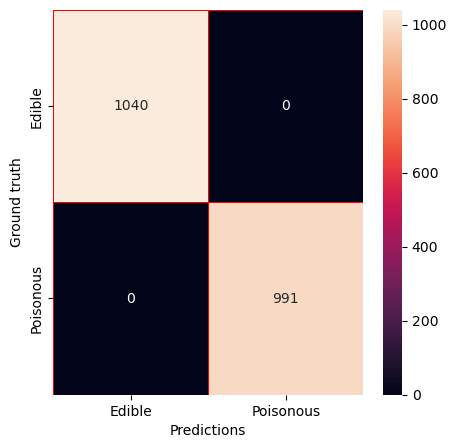

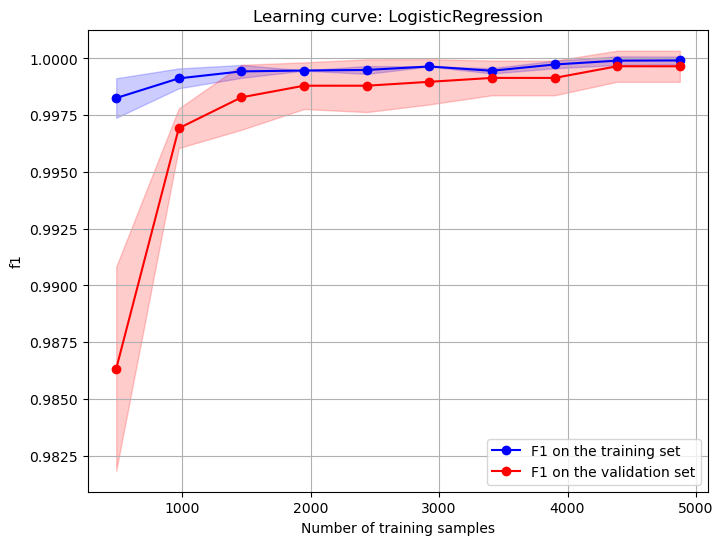

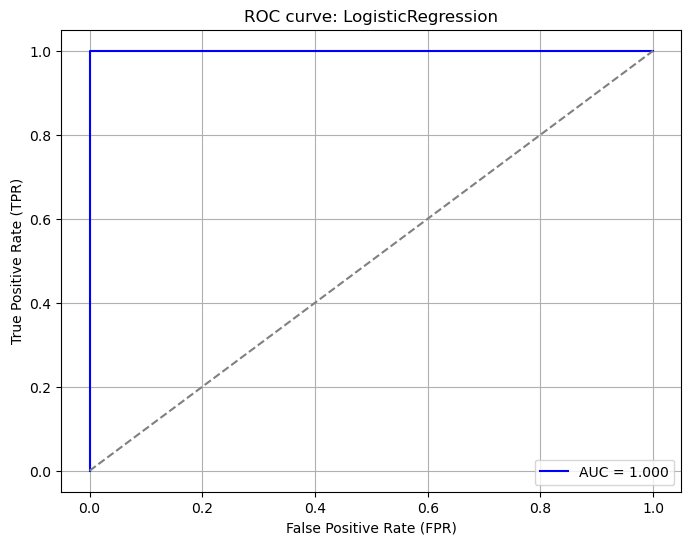

Standarized dataset
LogisticRegression(C=0.75, random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


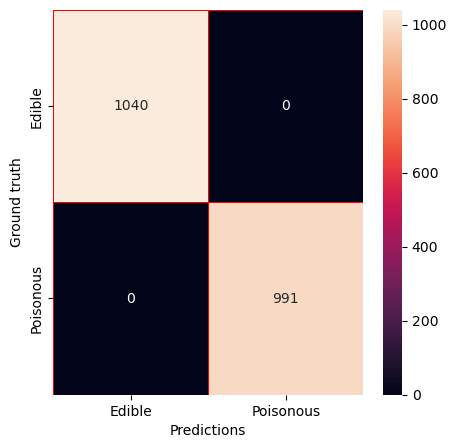

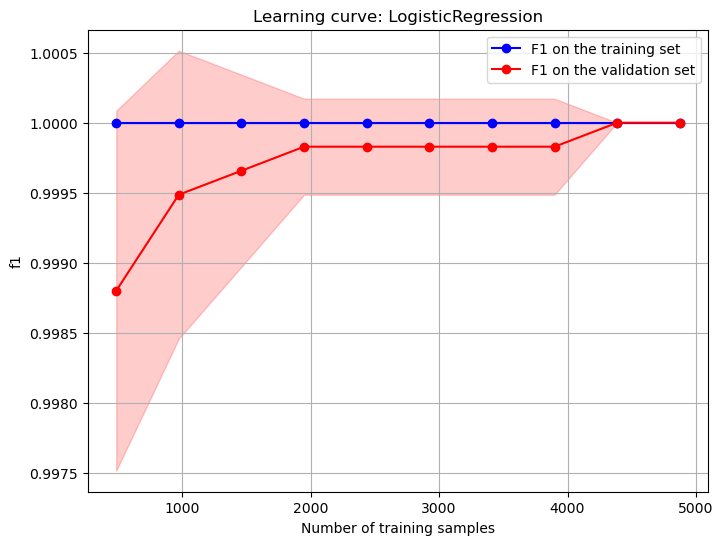

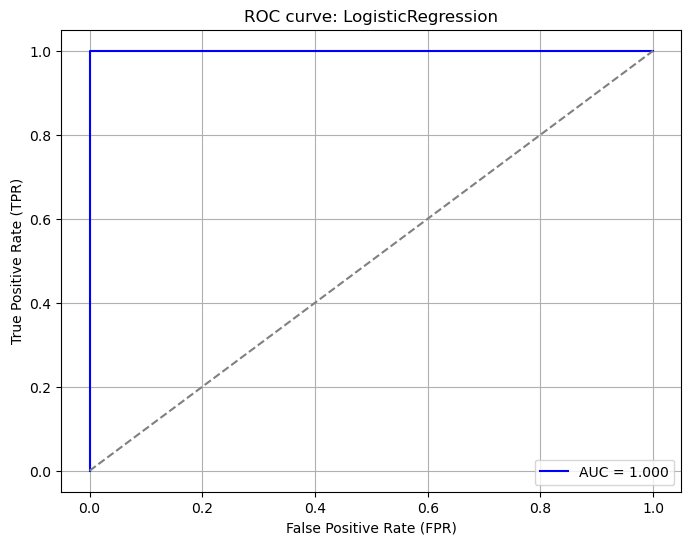

Normalized dataset
LogisticRegression(C=1.25, random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


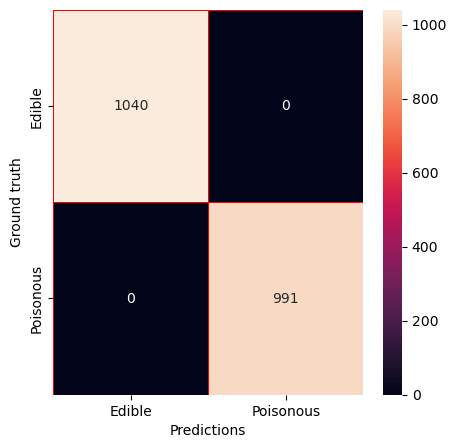

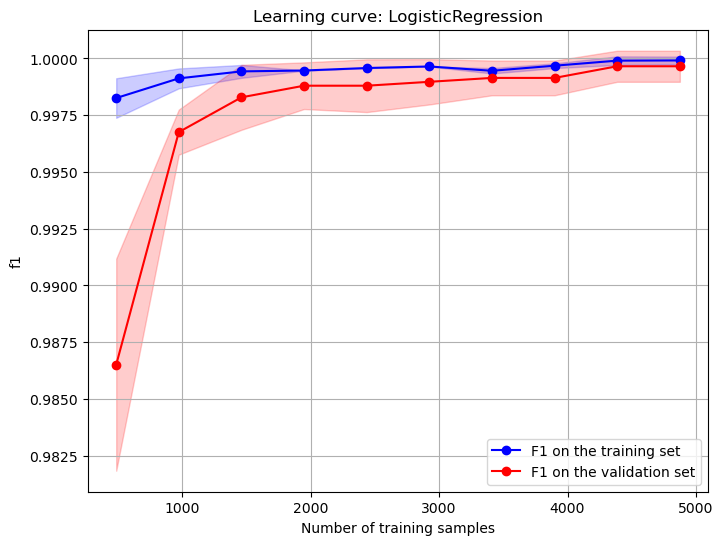

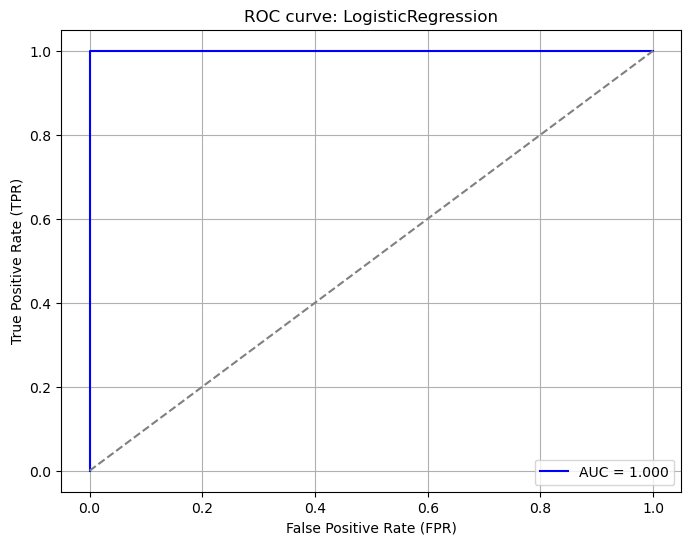

In [21]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)

### K-Nearest Neighbors Classifier

In [22]:
param_grid = {
    "n_neighbors": [2, 3, 5, 7, 11],
    "weights": ["uniform", "distance"],
    "algorithm": ["auto", "ball_tree", "kd_tree", "brute"],
    "leaf_size": [5, 10, 30],
}

fitted_estimators = {}

print(KNeighborsClassifier().get_params().keys())

for name, X_datasets in datasets.items():
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(
        estimator=KNeighborsClassifier(), param_grid=param_grid, train_X=current_train_X, train_y=y_train
    )
    fitted_estimators[name] = (model, X_datasets)

Base dataset
KNeighborsClassifier(leaf_size=5, n_neighbors=2)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


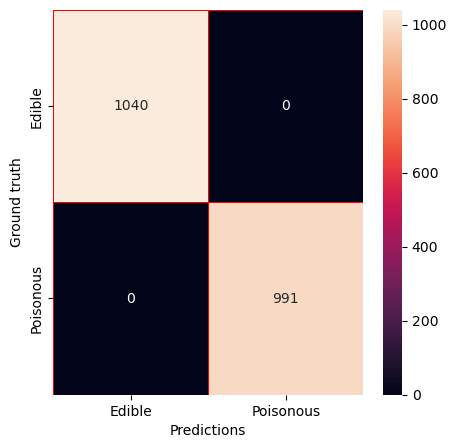

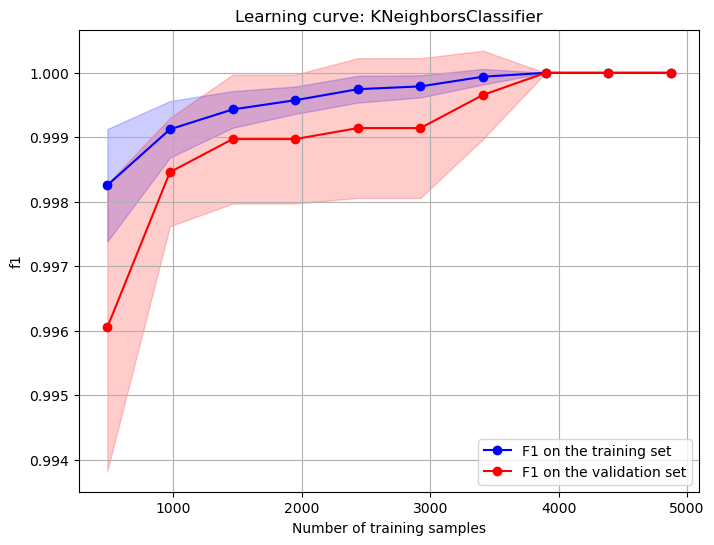

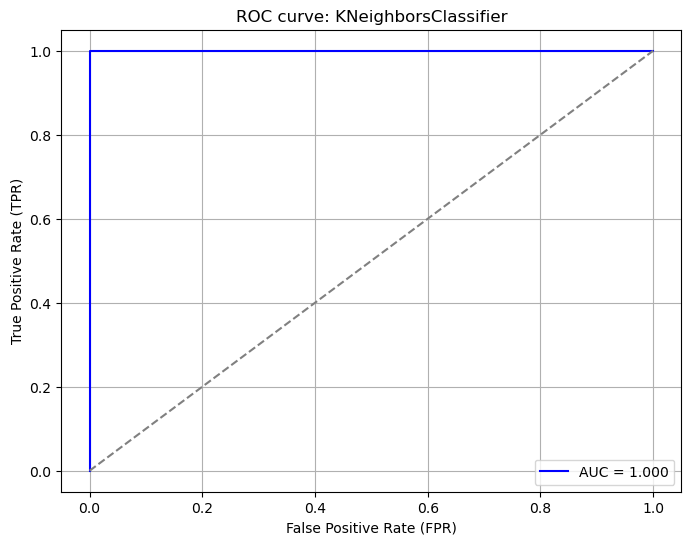

Standarized dataset
KNeighborsClassifier(leaf_size=5, n_neighbors=2, weights='distance')
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


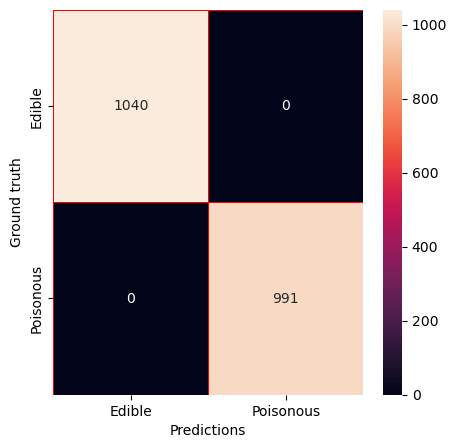

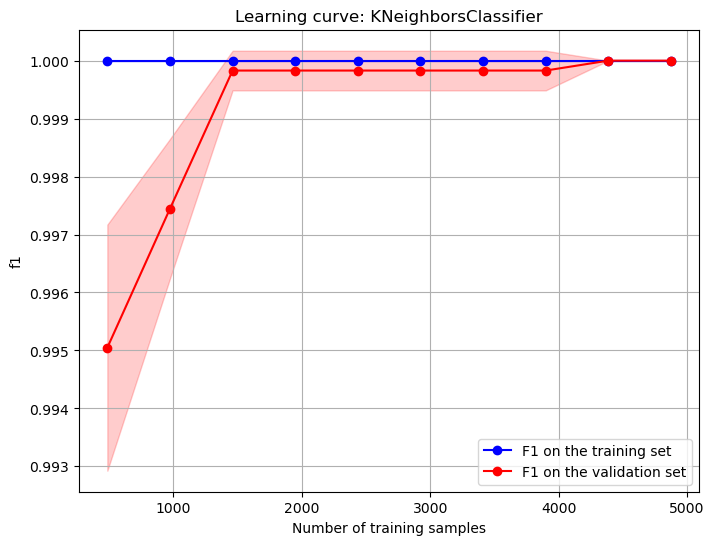

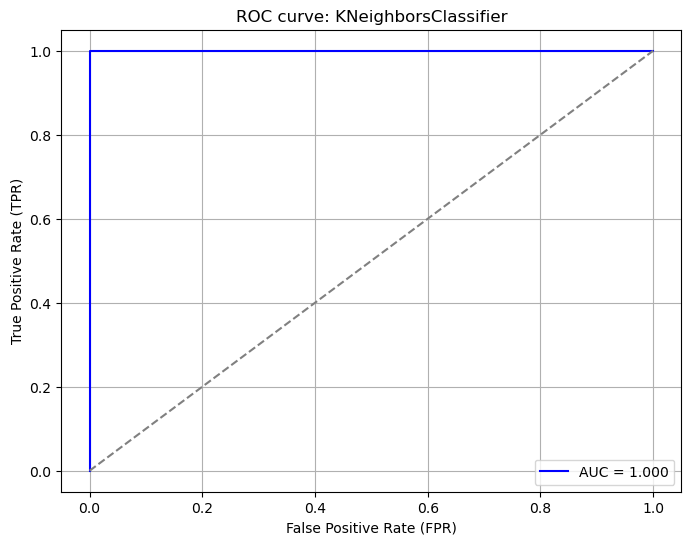

Normalized dataset
KNeighborsClassifier(leaf_size=5, n_neighbors=2)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


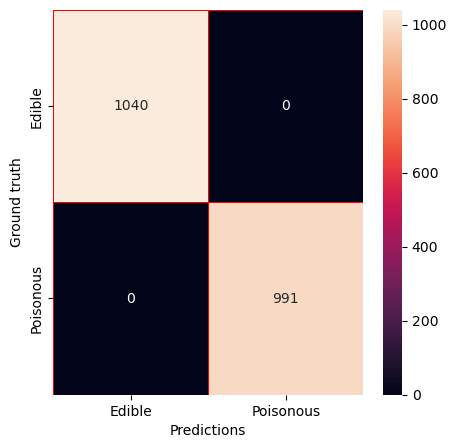

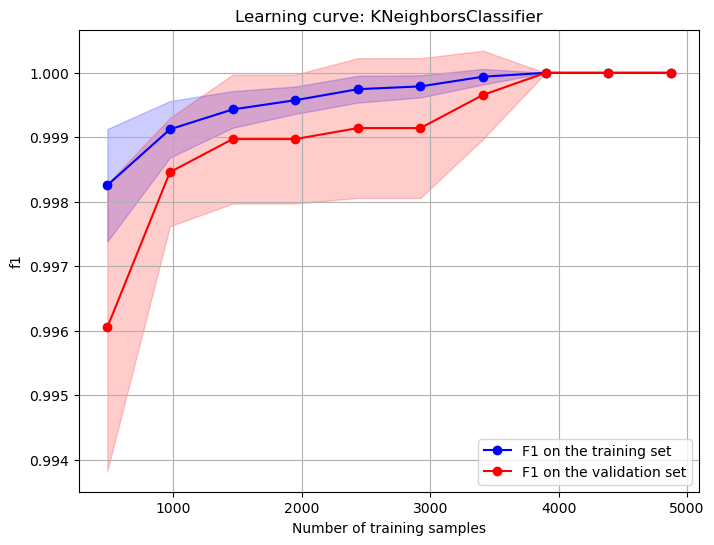

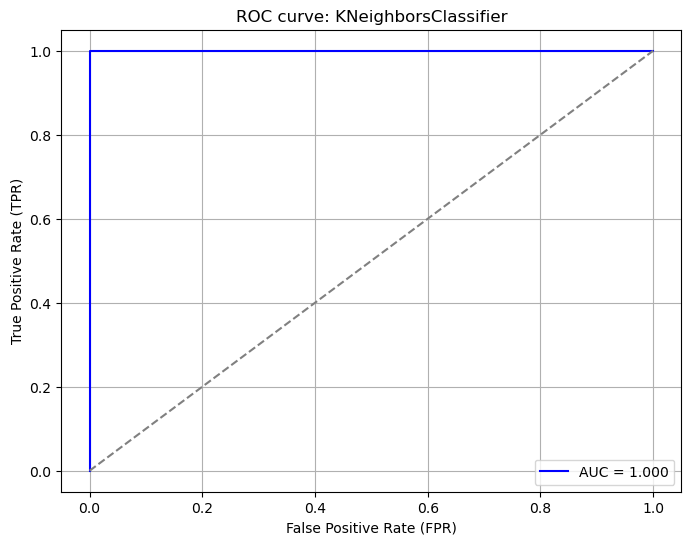

In [23]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)

### Support Vector Machine (Linear)

In [24]:
param_grid = {
    "C": [0.5, 1.0, 1.5],
    "kernel": ["linear"],
    "shrinking": [True, False],
    "max_iter": [-1, 100],
    "random_state": [42],
}

fitted_estimators = {}

for name, X_datasets in datasets.items():
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(estimator=SVC(), param_grid=param_grid, train_X=current_train_X, train_y=y_train)
    fitted_estimators[name] = (model, X_datasets)

Base dataset
SVC(C=0.5, kernel='linear', random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


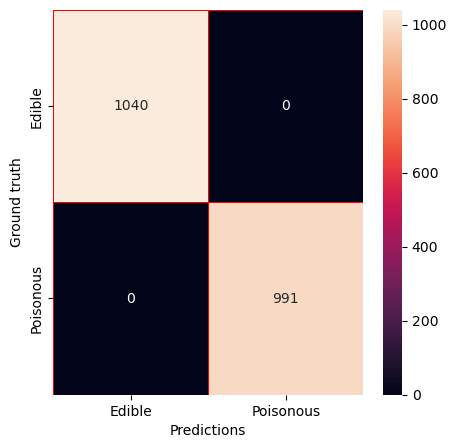

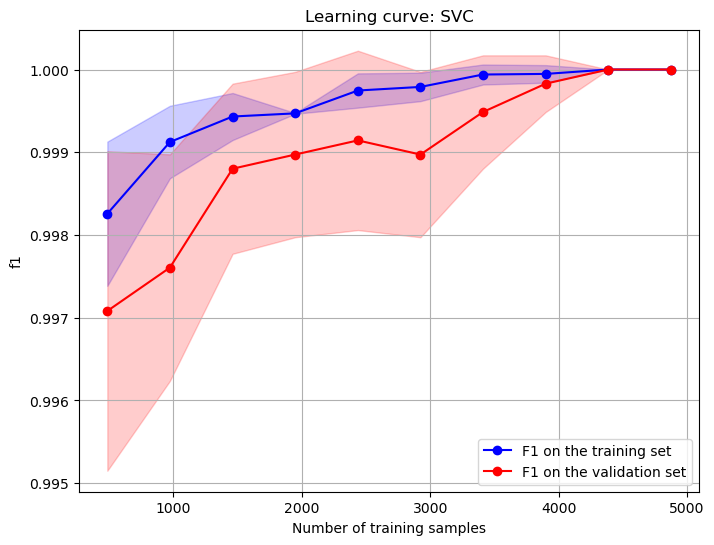

Standarized dataset
SVC(C=0.5, kernel='linear', random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


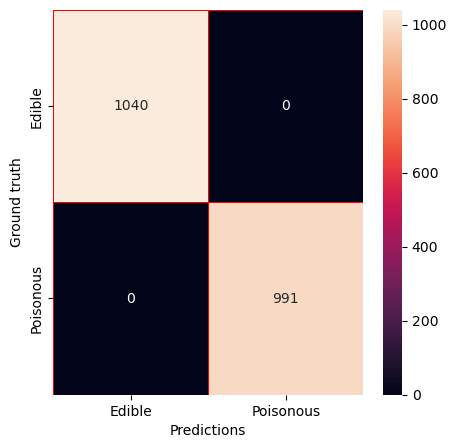

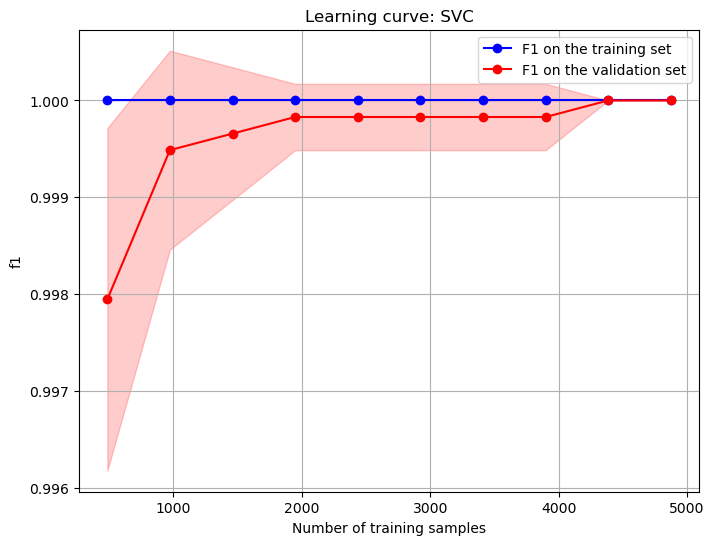

Normalized dataset
SVC(C=0.5, kernel='linear', random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


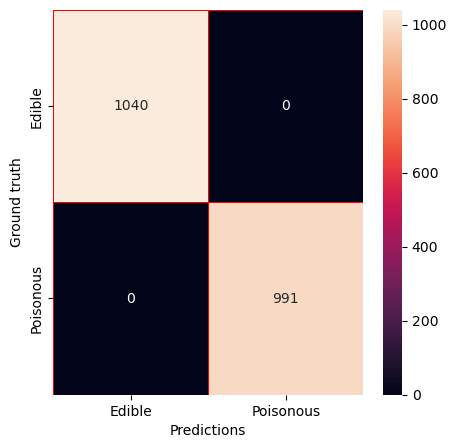

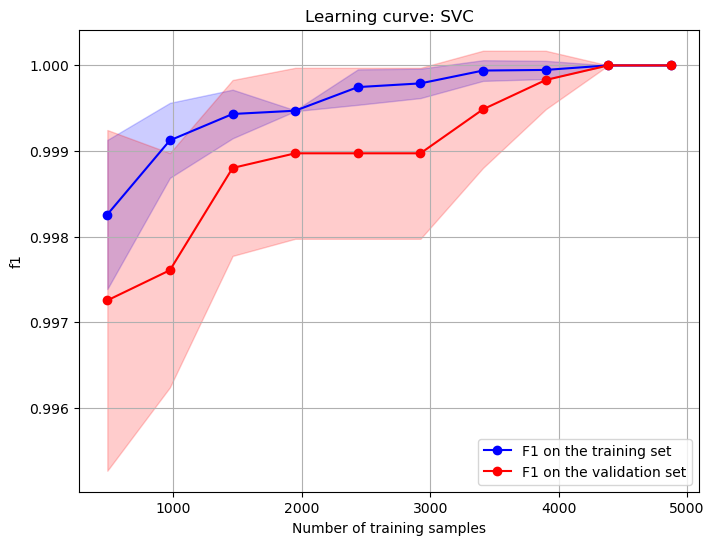

In [25]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)

### Support Vector Machine (Sigmoid)

In [26]:
param_grid = {
    "C": [0.5, 1.0, 1.5],
    "kernel": ["sigmoid"],
    "shrinking": [True, False],
    "max_iter": [-1, 100],
    "random_state": [42],
    "gamma": ["scale", "auto"],
}

fitted_estimators = {}

for name, X_datasets in datasets.items():
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(estimator=SVC(), param_grid=param_grid, train_X=current_train_X, train_y=y_train)
    fitted_estimators[name] = (model, X_datasets)

Base dataset
SVC(C=1.5, gamma='auto', kernel='sigmoid', random_state=42)
accuracy 0.9961
precision 1.0
recall 0.9919
f1 0.9959


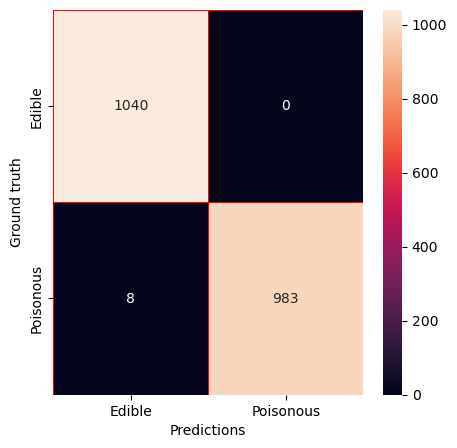

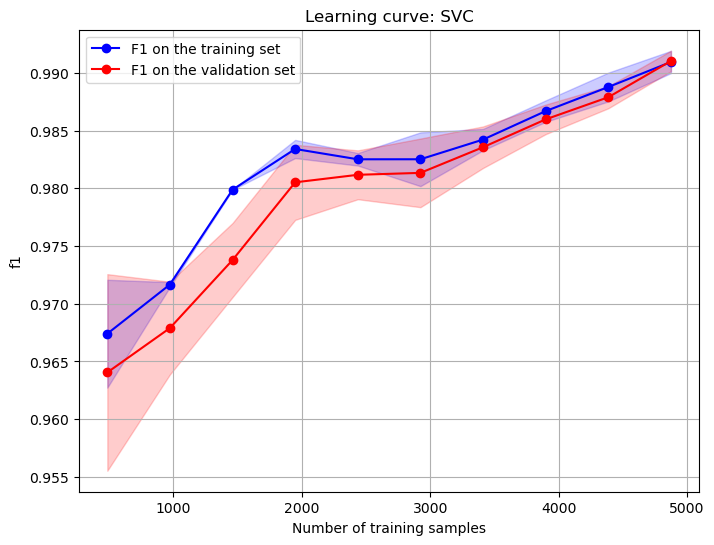

Standarized dataset
SVC(C=0.5, kernel='sigmoid', random_state=42)
accuracy 0.9956
precision 0.999
recall 0.9919
f1 0.9954


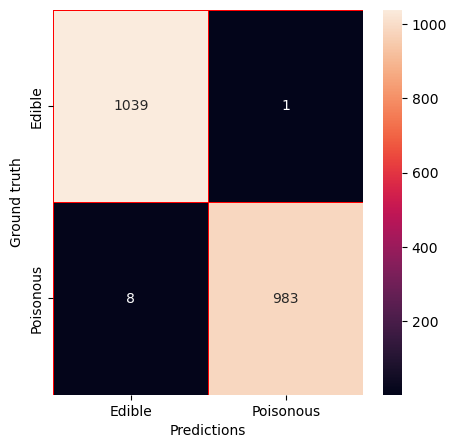

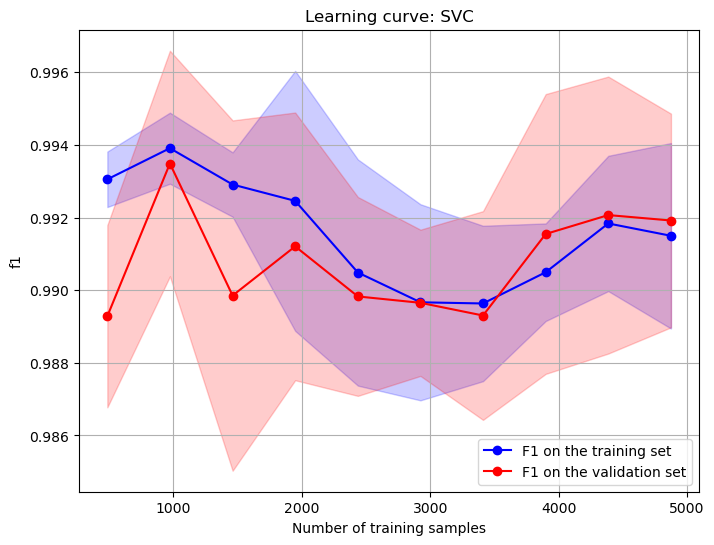

Normalized dataset
SVC(C=1.5, gamma='auto', kernel='sigmoid', random_state=42)
accuracy 0.9961
precision 1.0
recall 0.9919
f1 0.9959


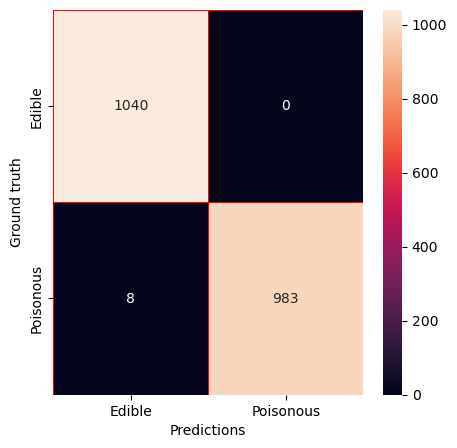

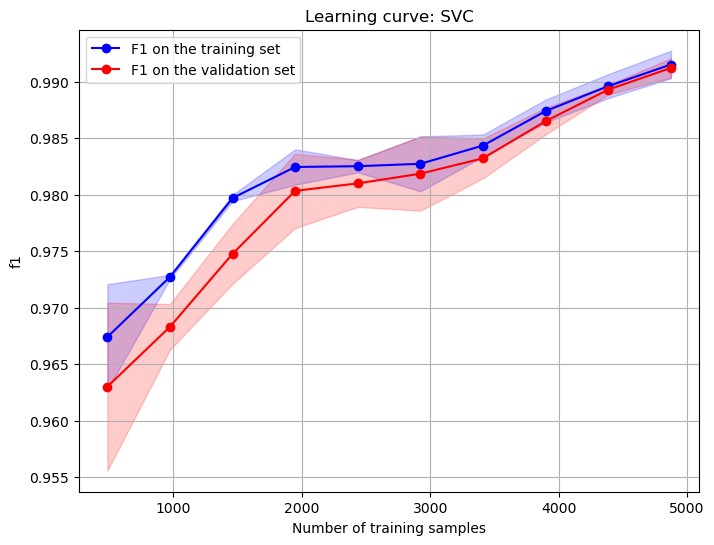

In [27]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)

### Support Vector Machine (Polynomial)

In [28]:
param_grid = {
    "C": [0.5, 1.0, 1.5],
    "kernel": ["poly"],
    "degree": [2, 3, 4],
    "shrinking": [True, False],
    "max_iter": [-1, 100],
    "random_state": [42],
    "gamma": ["scale", "auto"],
}

fitted_estimators = {}

for name, X_datasets in datasets.items():
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(estimator=SVC(), param_grid=param_grid, train_X=current_train_X, train_y=y_train)
    fitted_estimators[name] = (model, X_datasets)

Base dataset
SVC(C=0.5, kernel='poly', random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


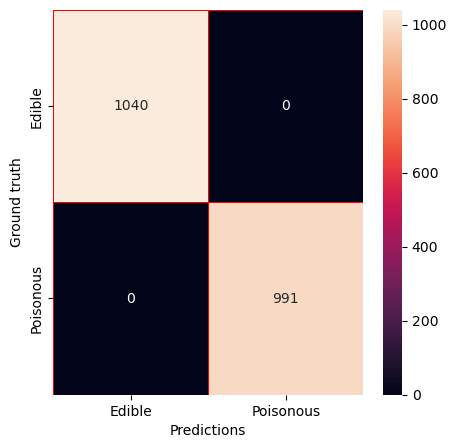

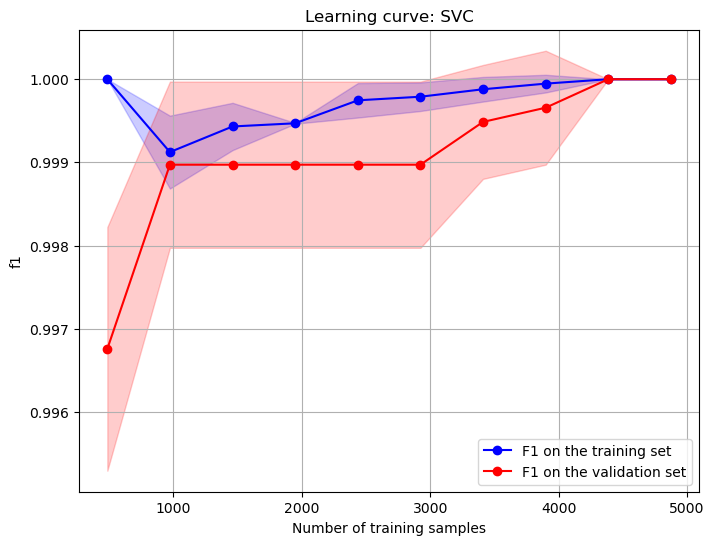

Standarized dataset
SVC(degree=4, kernel='poly', random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


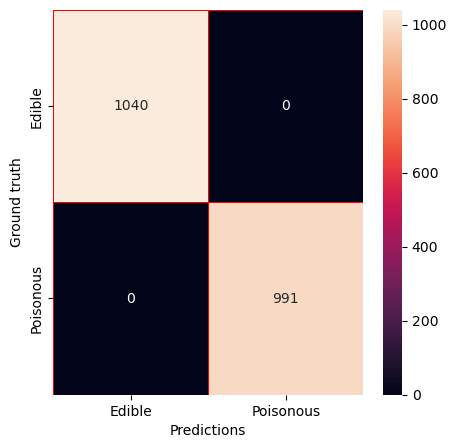

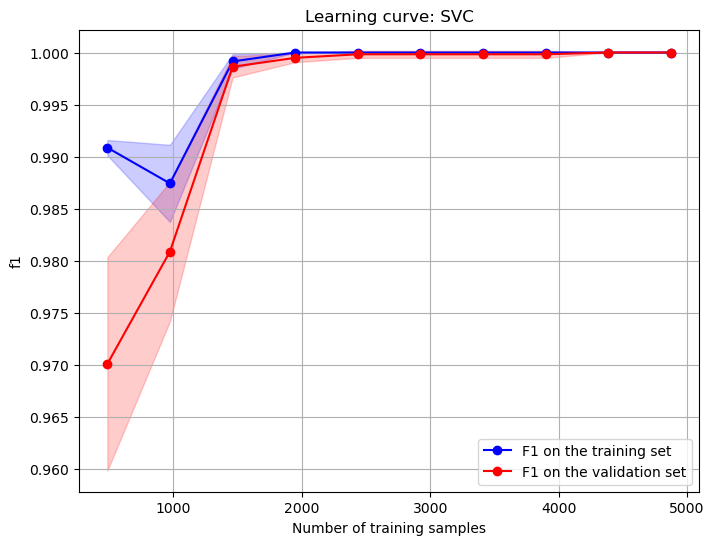

Normalized dataset
SVC(C=0.5, kernel='poly', random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


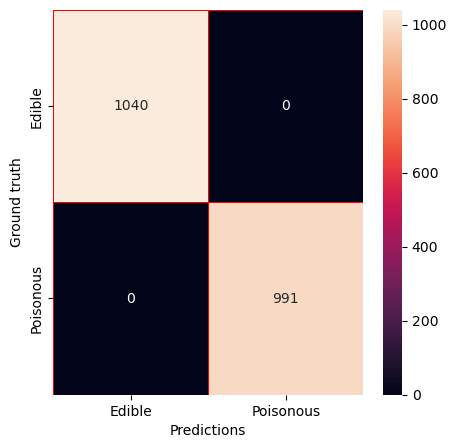

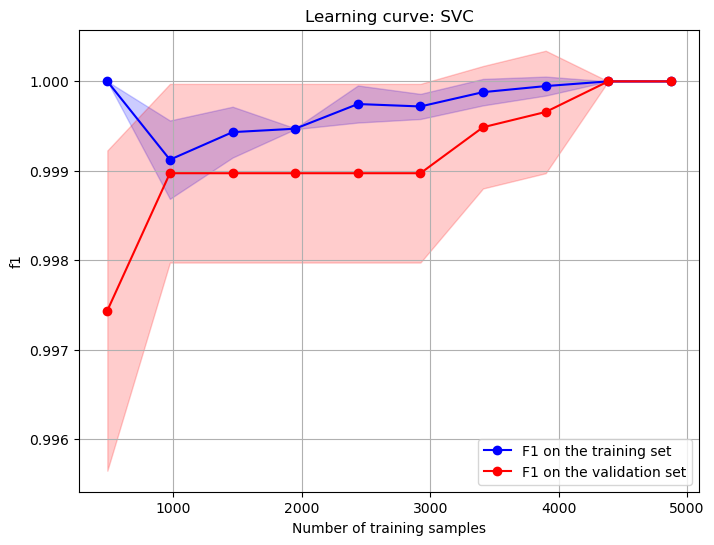

In [29]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)

### Naive Bayes Classifier

In [30]:
param_grid = {"var_smoothing": [1e-3, 1e-4, 1e-5, 1e-6, 1e-7, 1e-8, 1e-9]}

fitted_estimators = {}

for name, X_datasets in datasets.items():
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(estimator=GaussianNB(), param_grid=param_grid, train_X=current_train_X, train_y=y_train)
    fitted_estimators[name] = (model, X_datasets)

Base dataset
GaussianNB(var_smoothing=0.001)
accuracy 0.9838
precision 0.9678
recall 1.0
f1 0.9836


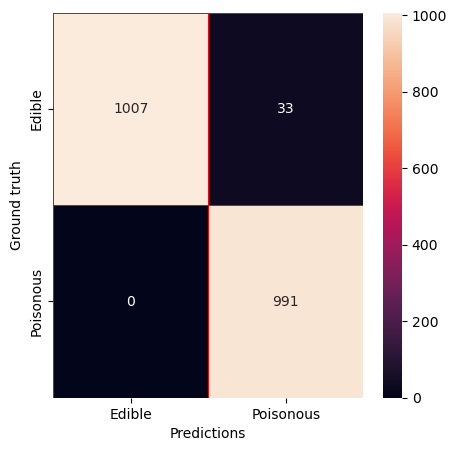

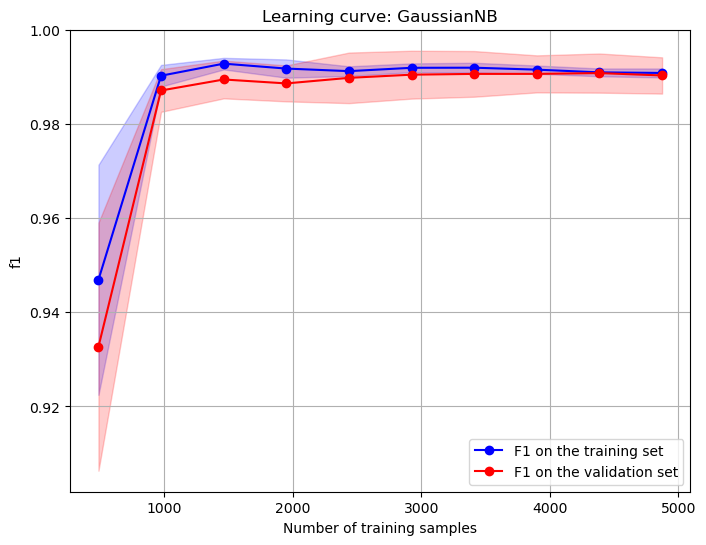

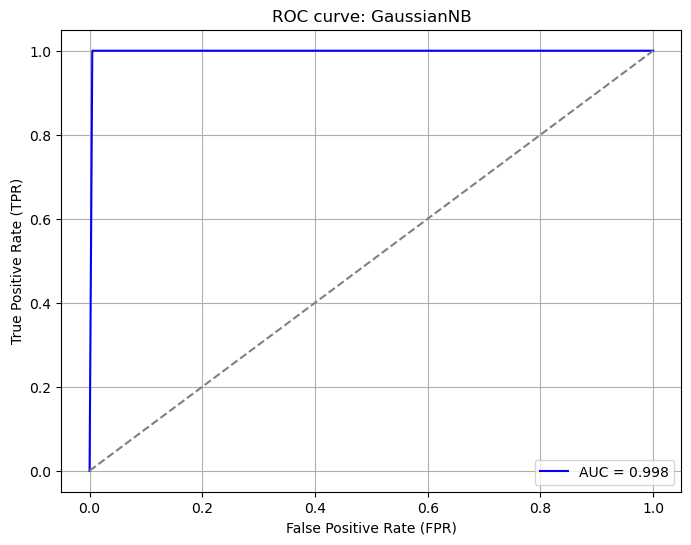

Standarized dataset
GaussianNB(var_smoothing=0.001)
accuracy 0.9838
precision 0.9678
recall 1.0
f1 0.9836


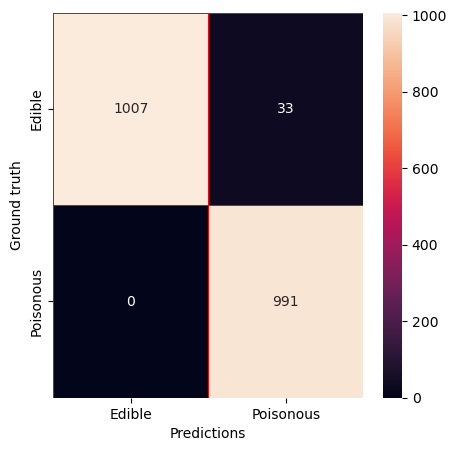

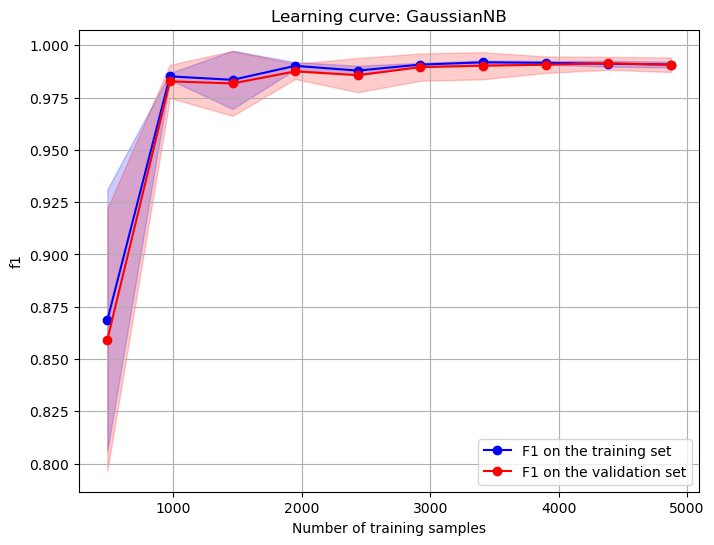

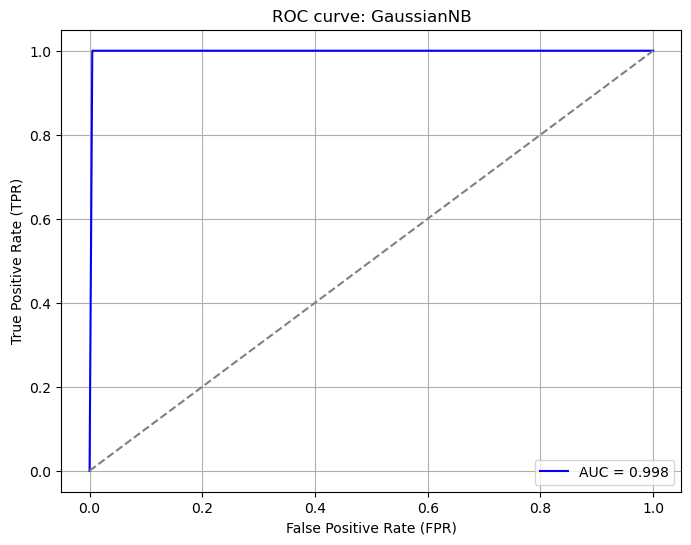

Normalized dataset
GaussianNB(var_smoothing=0.001)
accuracy 0.9838
precision 0.9678
recall 1.0
f1 0.9836


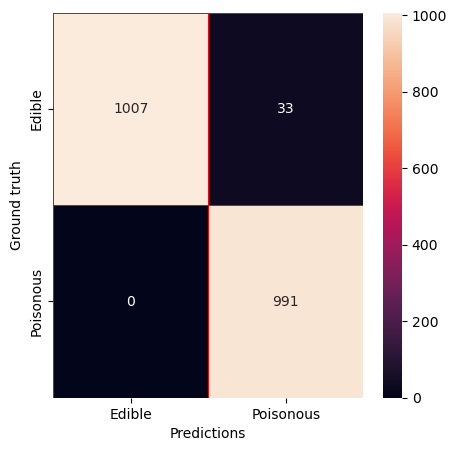

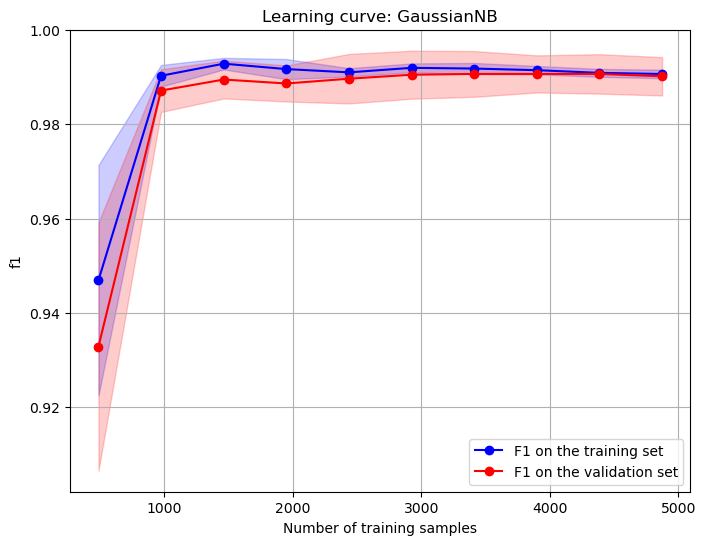

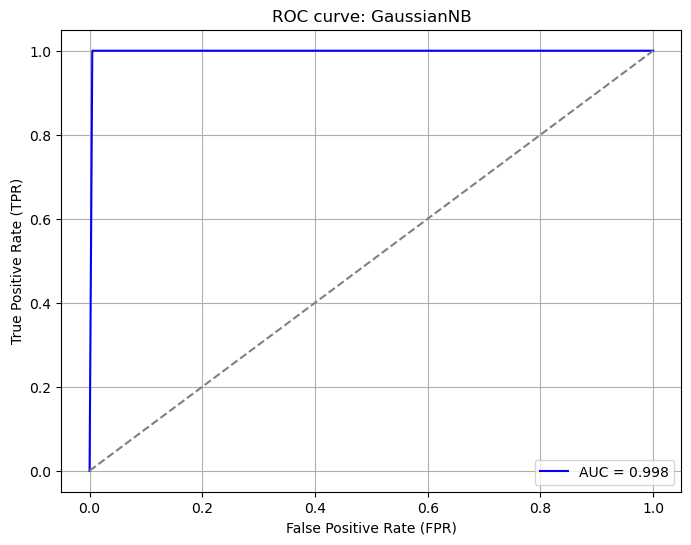

In [31]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)

### Decision Tree Algorithm

In [32]:
param_grid = {
    "criterion": ["gini", "entropy", "log_loss"],
    "splitter": ["best", "random"],
    "max_depth": [None, 2, 3, 5, 7],
    "min_samples_split": [2, 3, 5, 7],
    "min_samples_leaf": [1, 2, 3, 5, 7],
    "random_state": [42],
    "max_features": [None, "sqrt", "log2"],
}

fitted_estimators = {}

for name, X_datasets in datasets.items():
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(
        estimator=DecisionTreeClassifier(), param_grid=param_grid, train_X=current_train_X, train_y=y_train
    )
    fitted_estimators[name] = (model, X_datasets)

Base dataset
DecisionTreeClassifier(random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


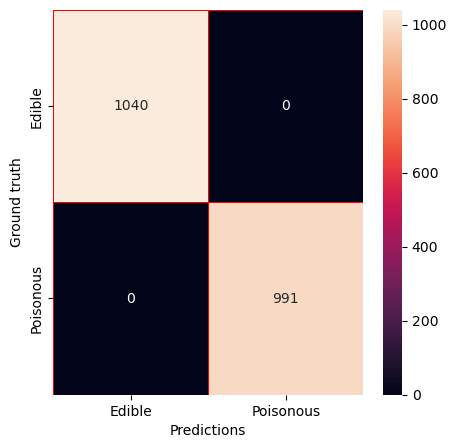

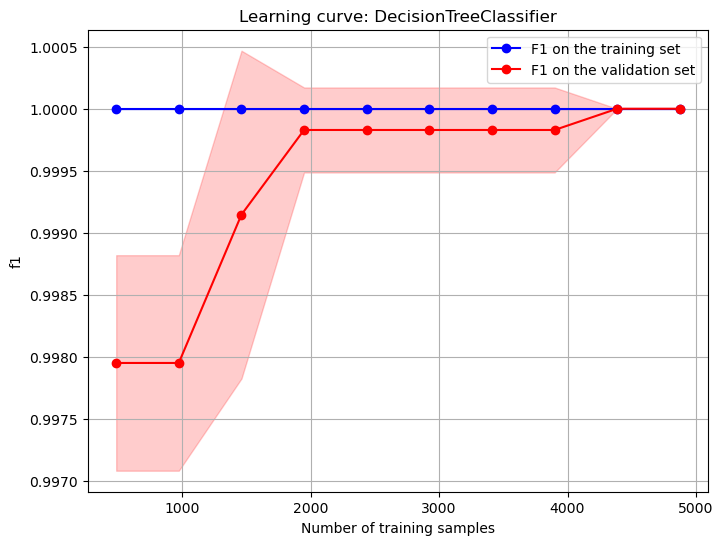

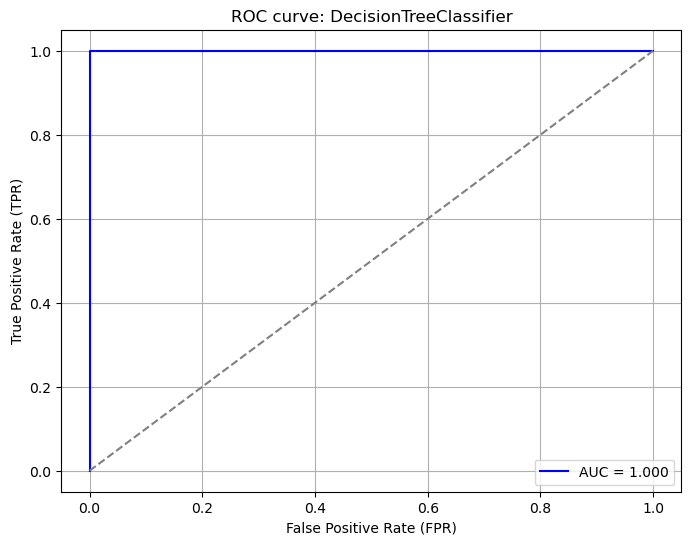

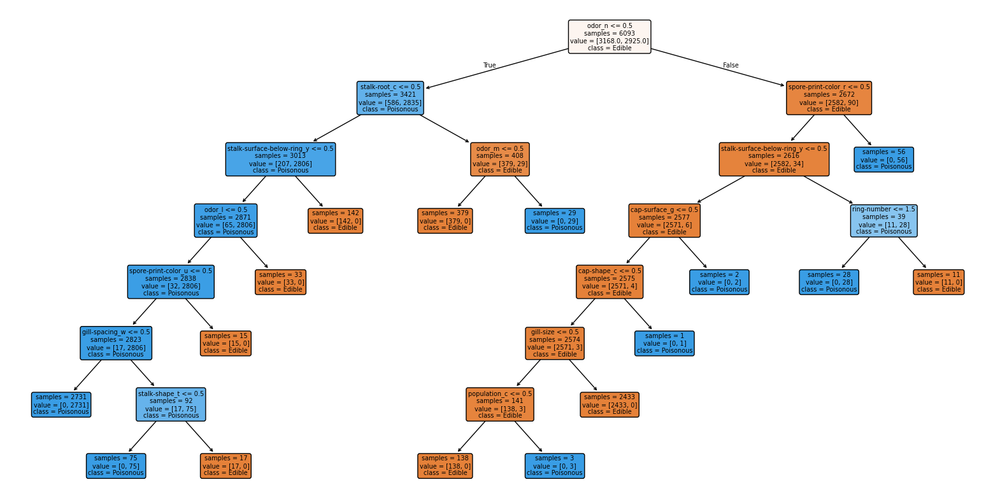

bruises          0.000000
gill-size        0.000040
ring-number      0.005193
stalk-shape_t    0.009113
cap-shape_c      0.000656
                   ...   
habitat_l        0.000000
habitat_m        0.000000
habitat_p        0.000000
habitat_u        0.000000
habitat_w        0.000000
Length: 94, dtype: float64
odor_n                        0.623501
stalk-root_c                  0.174842
stalk-surface-below-ring_y    0.097924
spore-print-color_r           0.035119
odor_l                        0.020968
odor_m                        0.017713
spore-print-color_u           0.009693
stalk-shape_t                 0.009113
ring-number                   0.005193
gill-spacing_w                0.001998
population_c                  0.001931
cap-surface_g                 0.001310
cap-shape_c                   0.000656
gill-size                     0.000040
dtype: float64

Standarized dataset
DecisionTreeClassifier(random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


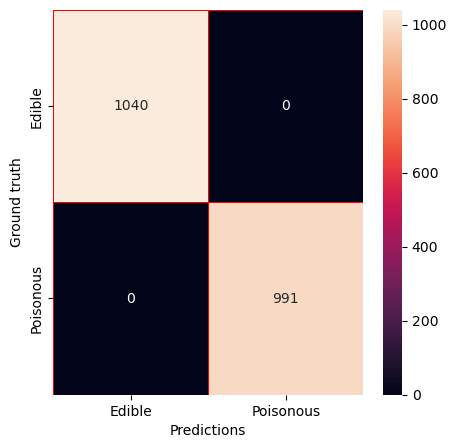

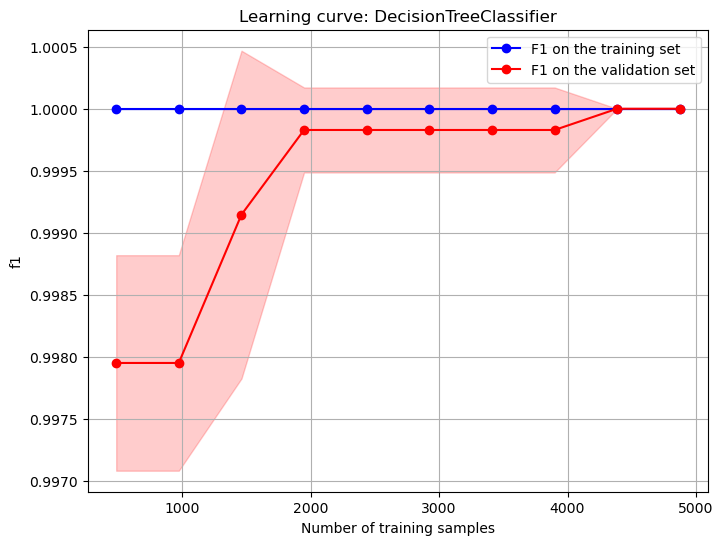

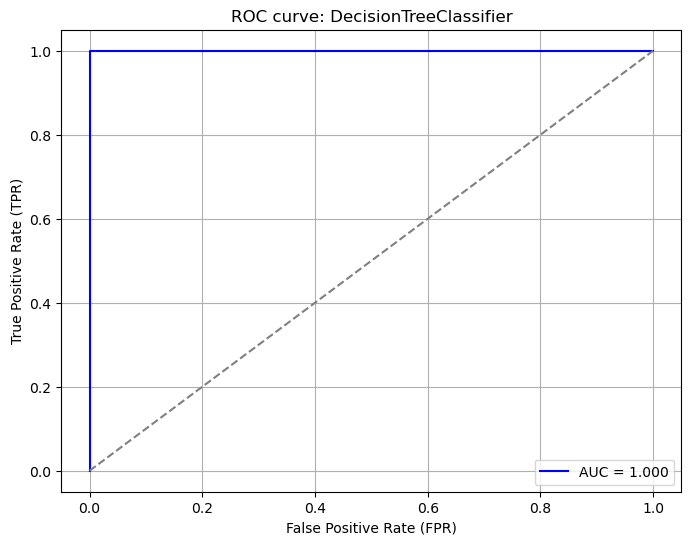

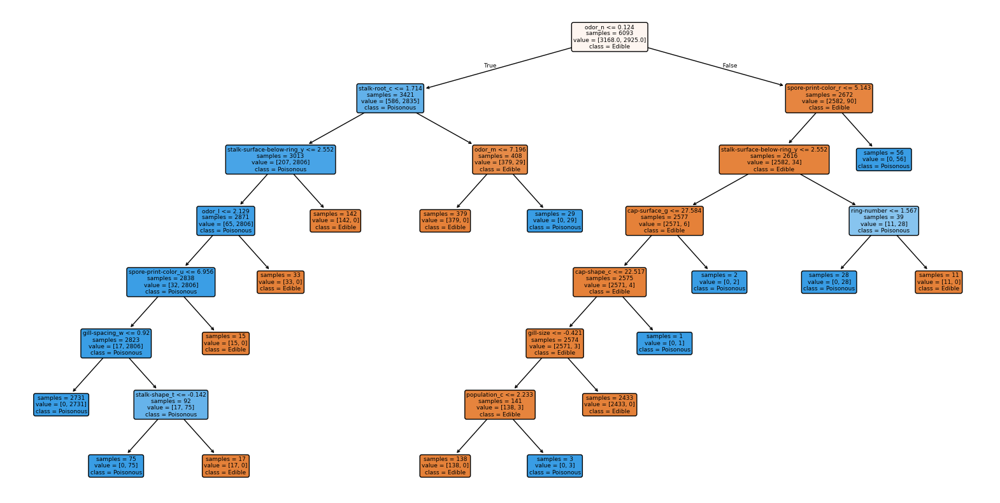

bruises          0.000000
gill-size        0.000040
ring-number      0.005193
stalk-shape_t    0.009113
cap-shape_c      0.000656
                   ...   
habitat_l        0.000000
habitat_m        0.000000
habitat_p        0.000000
habitat_u        0.000000
habitat_w        0.000000
Length: 94, dtype: float64
odor_n                        0.623501
stalk-root_c                  0.174842
stalk-surface-below-ring_y    0.097924
spore-print-color_r           0.035119
odor_l                        0.020968
odor_m                        0.017713
spore-print-color_u           0.009693
stalk-shape_t                 0.009113
ring-number                   0.005193
gill-spacing_w                0.001998
population_c                  0.001931
cap-surface_g                 0.001310
cap-shape_c                   0.000656
gill-size                     0.000040
dtype: float64

Normalized dataset
DecisionTreeClassifier(random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


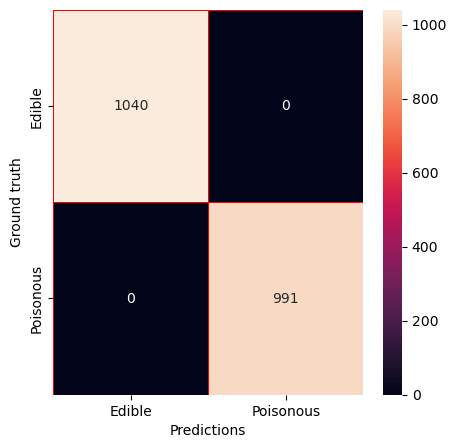

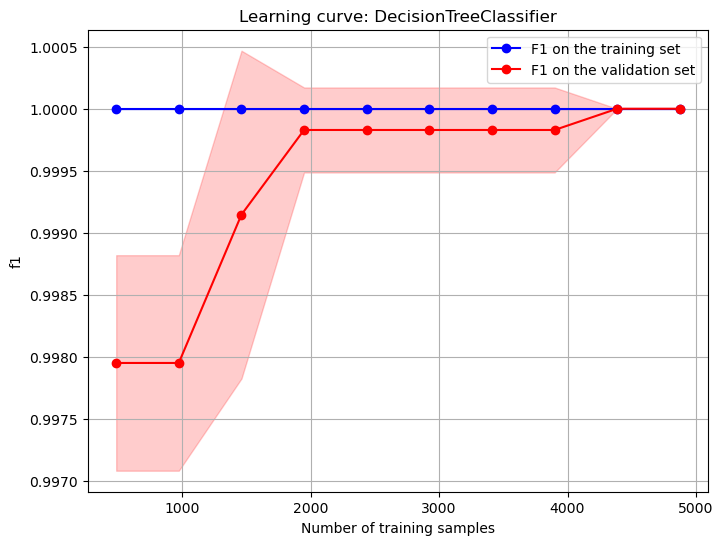

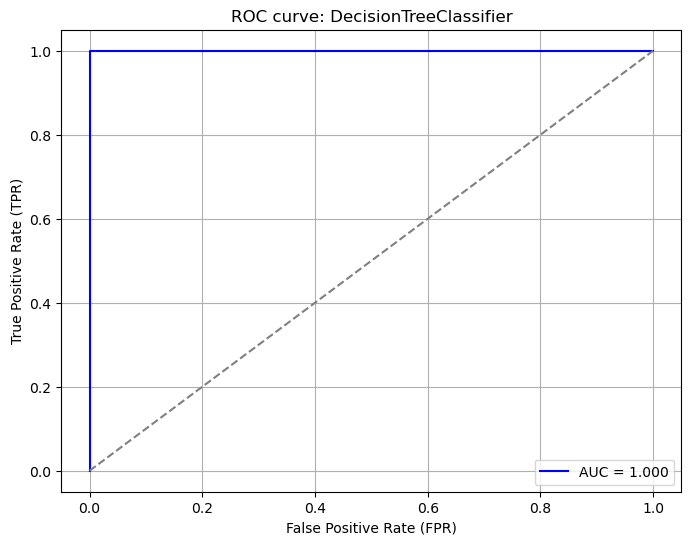

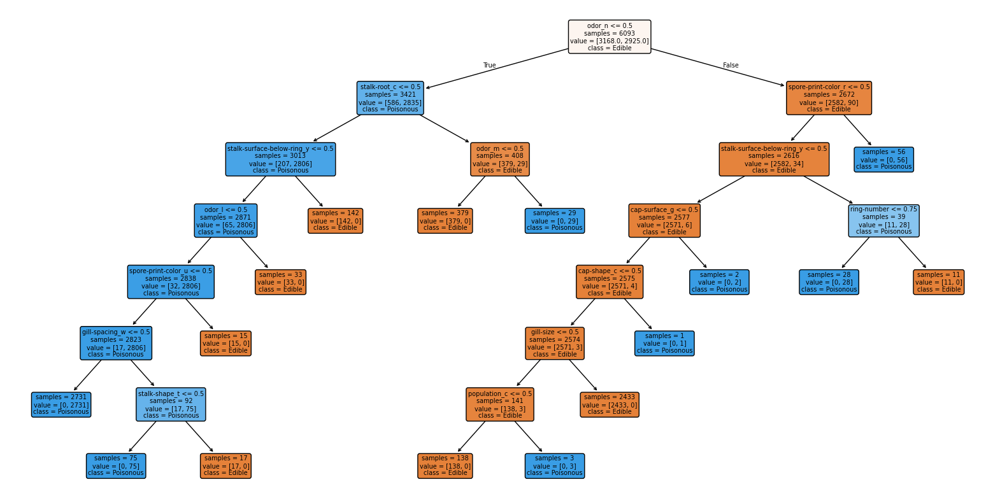

bruises          0.000000
gill-size        0.000040
ring-number      0.005193
stalk-shape_t    0.009113
cap-shape_c      0.000656
                   ...   
habitat_l        0.000000
habitat_m        0.000000
habitat_p        0.000000
habitat_u        0.000000
habitat_w        0.000000
Length: 94, dtype: float64
odor_n                        0.623501
stalk-root_c                  0.174842
stalk-surface-below-ring_y    0.097924
spore-print-color_r           0.035119
odor_l                        0.020968
odor_m                        0.017713
spore-print-color_u           0.009693
stalk-shape_t                 0.009113
ring-number                   0.005193
gill-spacing_w                0.001998
population_c                  0.001931
cap-surface_g                 0.001310
cap-shape_c                   0.000656
gill-size                     0.000040
dtype: float64



In [33]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)
    
    fig = plt.figure(figsize=(20, 10))
    plot_tree(
        model,
        filled=True,
        feature_names=X.columns,
        class_names=["Edible", "Poisonous"],
        impurity=False,
        rounded=True,
    )
    plt.show()
    fig.savefig(f"{project_path}/tree {model} {name}.jpg")
    
    feature_importances = pd.Series(model.feature_importances_, index=X.columns)
    print(feature_importances)
    print(feature_importances[feature_importances > 0].sort_values(ascending=False))
    print()

### Random Forest Algorithm

In [34]:
param_grid = {
    "n_estimators": [2, 10, 50],
    "criterion": ["gini", "entropy", "log_loss"],
    "max_depth": [None, 2, 3, 5, 7],
    "min_samples_split": [2, 3, 5, 7],
    "random_state": [42],
    "max_features": [None, "sqrt", "log2"],
}

fitted_estimators = {}

for name, X_datasets in datasets.items():
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    model = make_gridsearch(
        estimator=RandomForestClassifier(), param_grid=param_grid, train_X=current_train_X, train_y=y_train
    )
    fitted_estimators[name] = (model, X_datasets)

Base dataset
RandomForestClassifier(max_features=None, n_estimators=50, random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


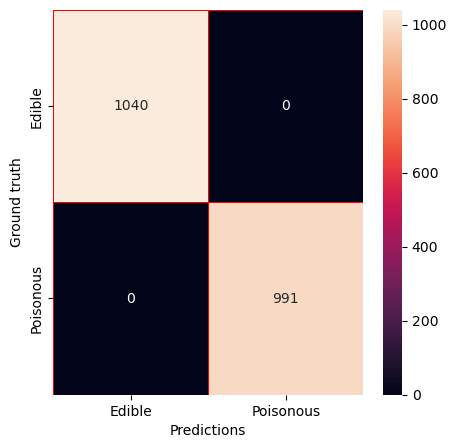

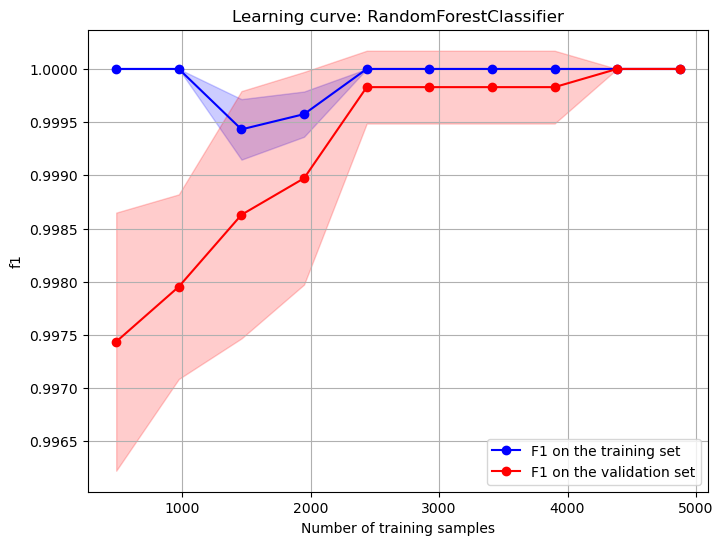

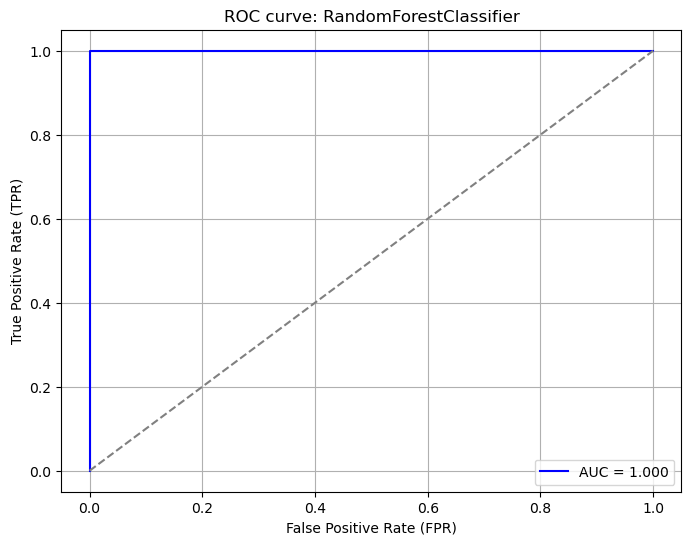

Standarized dataset
RandomForestClassifier(max_features=None, n_estimators=50, random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


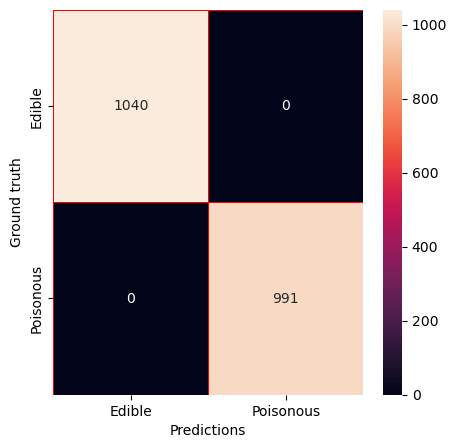

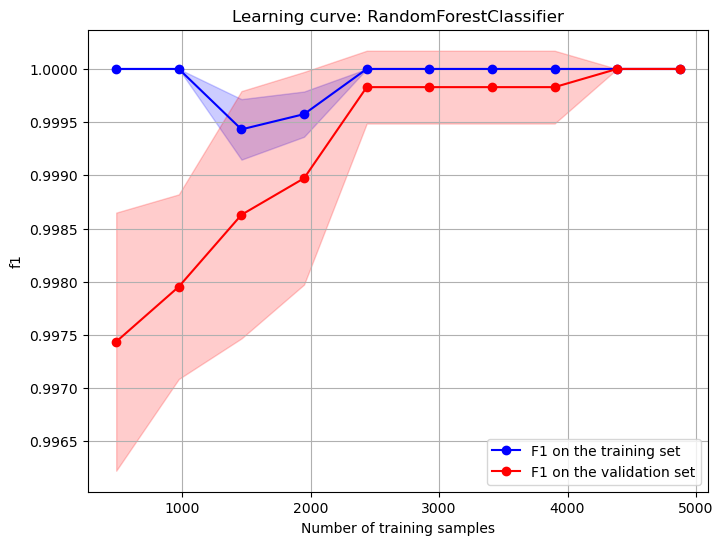

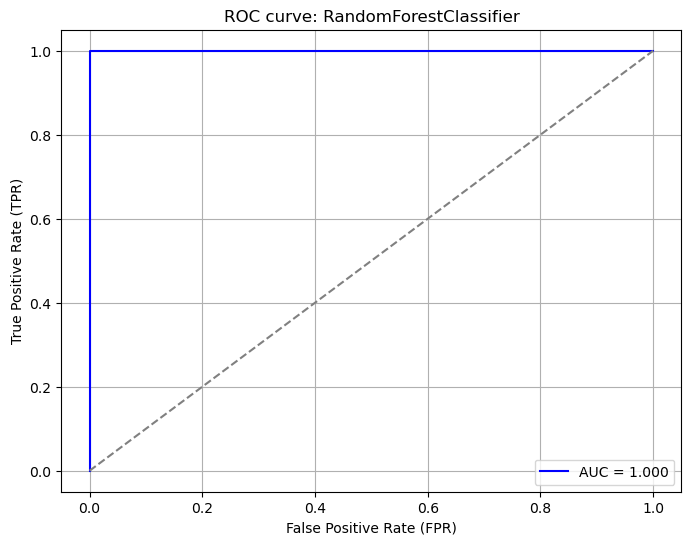

Normalized dataset
RandomForestClassifier(max_features=None, n_estimators=50, random_state=42)
accuracy 1.0
precision 1.0
recall 1.0
f1 1.0


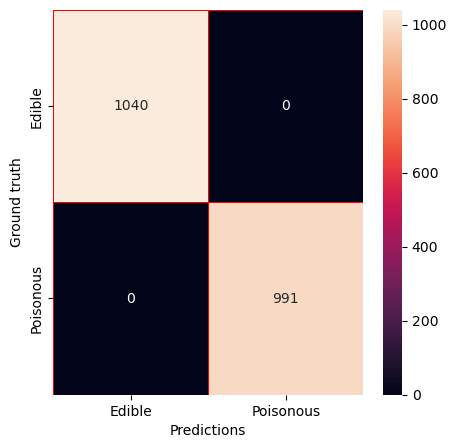

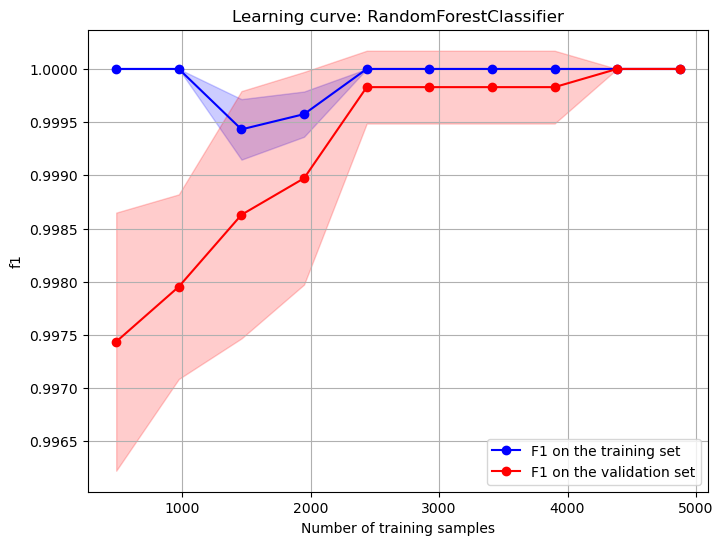

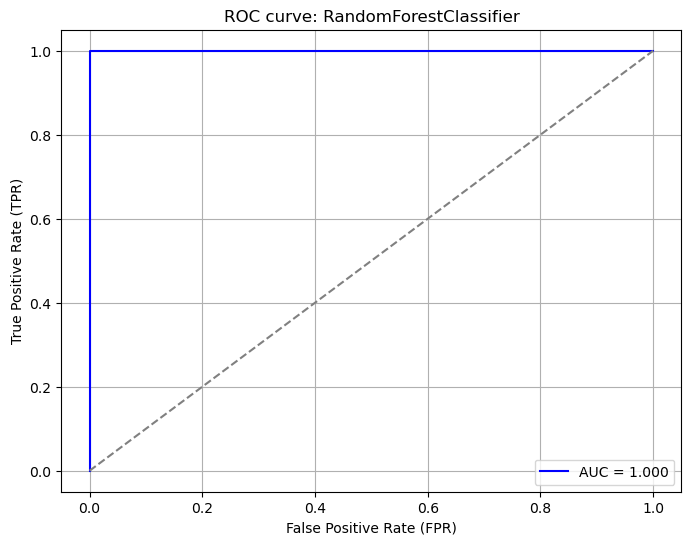

In [35]:
for name, (model, X_datasets) in fitted_estimators.items():
    print(f"{name} dataset")
    current_train_X = X_datasets["train_X"]
    current_test_X = X_datasets["test_X"]
    evaluate_model(estimator=model, test_X=current_test_X, y_test_true=y_test, name=name)
    plot_learning_curve(estimator=model, X_array=current_train_X, y_array=y_train, name=name)
    plot_roc_curve(estimator=model, test_X=current_test_X, test_y=y_test, name=name)